In [5]:
import os
import pandas as pd
import numpy as np
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Conv1D, BatchNormalization, Activation, Add, Input, GlobalAveragePooling1D, Dense, MaxPooling1D
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap

In [21]:
def load_waveform_data(data_dir):
    normal_waveforms = []
    abnormal_waveforms = []
    
    normal_path = os.path.join(data_dir, 'dataset_normal')
    for filename in os.listdir(normal_path):
        if filename.endswith('.xlsx'):
            filepath = os.path.join(normal_path, filename)
            df = pd.read_excel(filepath, header=None)
            waveform = df.values
            normal_waveforms.append(waveform)
    
    abnormal_path = os.path.join(data_dir, 'dataset_anomaly')
    for filename in os.listdir(abnormal_path):
        if filename.endswith('.xlsx'):
            filepath = os.path.join(abnormal_path, filename)
            df = pd.read_excel(filepath, header=None)
            waveform = df.values
            abnormal_waveforms.append(waveform)
    
    waveforms = np.array(list(normal_waveforms) + abnormal_waveforms)
    labels = np.array([0] * len(normal_waveforms) + [1] * len(abnormal_waveforms))

    return waveforms, labels

data_dir = r"C:\Users\r-fujita\Desktop\Phase2"
waveforms, labels = load_waveform_data(data_dir)


In [22]:
def resnet_block(input_tensor, filters, kernel_size, stride=1):
    x = Conv1D(filters, kernel_size, strides=stride, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    x = Conv1D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    if stride != 1 or input_tensor.shape[-1] != filters:
        shortcut = Conv1D(filters, kernel_size=1, strides=stride, padding='same')(input_tensor)
        shortcut = BatchNormalization()(shortcut)
    else:
        shortcut = input_tensor

    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def create_resnet_model(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv1D(64, kernel_size=7, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = MaxPooling1D(pool_size=3, strides=2, padding='same')(x)

    x = resnet_block(x, filters=64, kernel_size=3)
    x = resnet_block(x, filters=128, kernel_size=3, stride=2)
    x = resnet_block(x, filters=256, kernel_size=3, stride=2)
    x = resnet_block(x, filters=512, kernel_size=3, stride=2)

    x = GlobalAveragePooling1D()(x)
    outputs = Dense(1, activation='sigmoid')(x)
    
    model = Model(inputs, outputs)
    model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    return model

In [23]:
# データをトレーニングセットとテストセットに分割
X_train, X_test, y_train, y_test = train_test_split(waveforms, labels, test_size=0.2, random_state=42)
X_train = X_train.astype(float)
y_train = y_train.astype(float)
# モデルの作成とトレーニング
input_shape = (200, 8)
model = create_resnet_model(input_shape)
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2)

Epoch 1/50
490/490 [==============================] - 23s 33ms/step - loss: 0.1303 - accuracy: 0.9669 - val_loss: 0.1675 - val_accuracy: 0.9545
Epoch 2/50
490/490 [==============================] - 17s 34ms/step - loss: 0.0789 - accuracy: 0.9784 - val_loss: 0.0724 - val_accuracy: 0.9824
Epoch 3/50
490/490 [==============================] - 18s 36ms/step - loss: 0.0555 - accuracy: 0.9845 - val_loss: 0.0487 - val_accuracy: 0.9865
Epoch 4/50
490/490 [==============================] - 18s 36ms/step - loss: 0.0449 - accuracy: 0.9870 - val_loss: 0.0443 - val_accuracy: 0.9872
Epoch 5/50
490/490 [==============================] - 18s 36ms/step - loss: 0.0380 - accuracy: 0.9893 - val_loss: 0.0473 - val_accuracy: 0.9877
Epoch 6/50
490/490 [==============================] - 18s 36ms/step - loss: 0.0321 - accuracy: 0.9908 - val_loss: 0.0369 - val_accuracy: 0.9900
Epoch 7/50
490/490 [==============================] - 18s 36ms/step - loss: 0.0254 - accuracy: 0.9927 - val_loss: 0.0237 - val_accuracy:

In [5]:
print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100, 8)]     0           []                               
                                                                                                  
 conv1d (Conv1D)                (None, 50, 64)       3648        ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 50, 64)      256         ['conv1d[0][0]']                 
 alization)                                                                                       
                                                                                                  
 activation (Activation)        (None, 50, 64)       0           ['batch_normalization[0][0]']

In [24]:
from tensorflow.keras.models import save_model

# モデルを保存するパス
model_path = r"C:\Users\r-fujita\Desktop\Phase2\model"

# モデルの保存
save_model(model, model_path)

INFO:tensorflow:Assets written to: C:\Users\r-fujita\Desktop\Phase2\model\assets


INFO:tensorflow:Assets written to: C:\Users\r-fujita\Desktop\Phase2\model\assets


In [30]:
from tensorflow.keras.models import load_model

# ロードするモデルのパス
model_path = r"C:\Users\r-fujita\Desktop\Phase1\model"

# モデルのロード
model = load_model(model_path)

In [25]:
model.evaluate(X_test, y_test)

153/153 [==============================] - 2s 12ms/step - loss: 0.0300 - accuracy: 0.9935


[0.029955344274640083, 0.9934627413749695]

In [7]:
import os
import shutil
import pandas as pd

def move_abnormal_images(test_data, image_dir, dest_dir):
    """
    test_data の labels が 1 の folder_name と filename をリストアップし、
    対応する画像ファイルを別のフォルダに移動する。

    Args:
        test_data (list): テストデータのリスト
        image_dir (str): 画像ファイルが保存されているディレクトリ
        dest_dir (str): 画像ファイルを移動する先のディレクトリ
    """

    # labels が 1 のデータを抽出
    abnormal_data = [item for item in test_data if item['labels'] == 0]

    # folder_name の昇順、次に filename の昇順でソート
    sorted_data = sorted(abnormal_data, key=lambda item: (item['folder_name'], item['filename']))

    # folder_name と filename をリストに抽出
    folder_names = [item['folder_name'] for item in sorted_data]
    filenames = [item['filename'] for item in sorted_data]

    # データフレームを作成
    df = pd.DataFrame({'folder_name': folder_names, 'filename': filenames})

    # Excelファイルに出力
    df.to_excel('normal_data.xlsx', index=False)

    # 画像ファイルを移動
    for folder_name, filename in zip(folder_names, filenames):
        src_path = os.path.join(image_dir, f"{folder_name} - {filename.replace('.xlsx', '')}.jpg")
        dest_path = os.path.join(dest_dir, f"{folder_name} - {filename.replace('.xlsx', '')}.jpg")

        # ファイルが存在する場合は移動
        if os.path.exists(src_path):
            shutil.move(src_path, dest_path)
        else:
            print(f"Error: File not found - {src_path}")

# 画像ファイルが保存されているディレクトリ
image_dir = r"C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions"

# 画像ファイルを移動する先のディレクトリ
dest_dir = r"C:\Users\r-fujita\Desktop\ET\Phase3\0.90_normal_images"

# labels が 1 の画像ファイルを移動
move_abnormal_images(test_data, image_dir, dest_dir)

Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 001-003.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 003-001.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 003-003.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 004-007.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 005-002.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 005-003.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 005-004.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BCU_E-5432 - 005-006.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BTU_E-902C - 001-001.jpg
Error: File not found - C:\Users\r-fujita\Desktop\ET\Phase3\0.90_predictions\BTU_E

55/55 [==============================] - 1s 6ms/step
Thinning point for FCC_E-2316B/001-001.xlsx: 1551.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-001.xlsx_heatmap.png


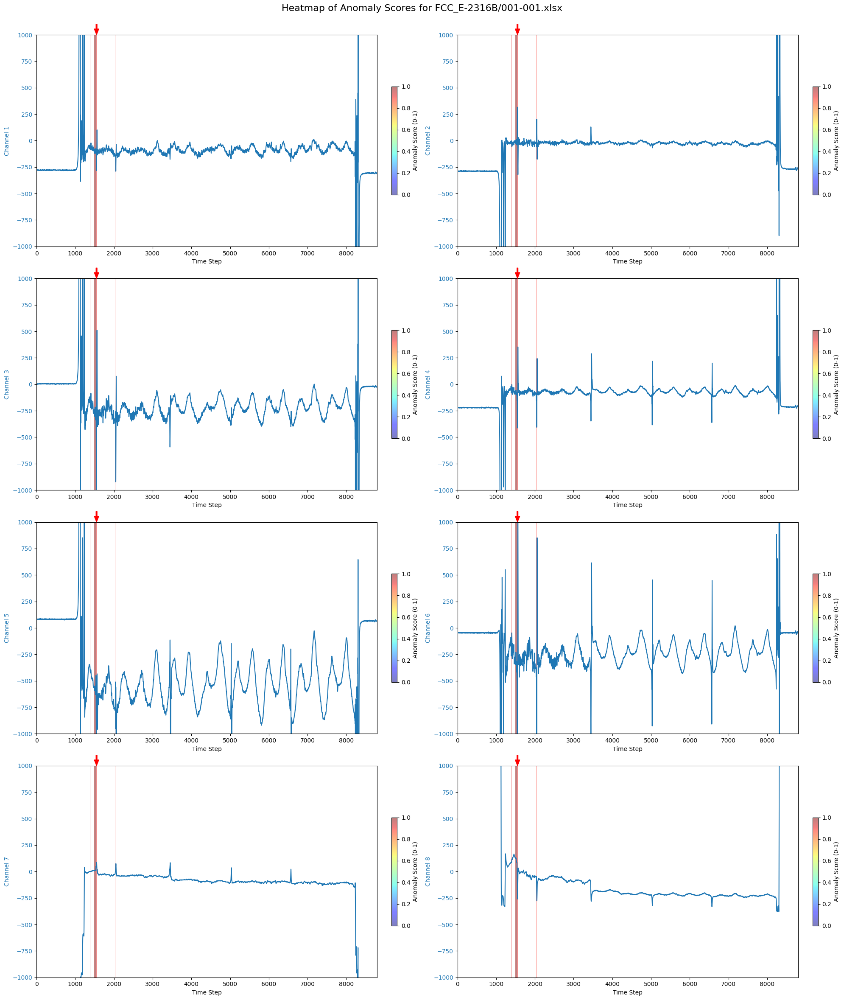

61/61 [==============================] - 0s 5ms/step
Thinning point for FCC_E-2316B/001-002.xlsx: 1249.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-002.xlsx_heatmap.png


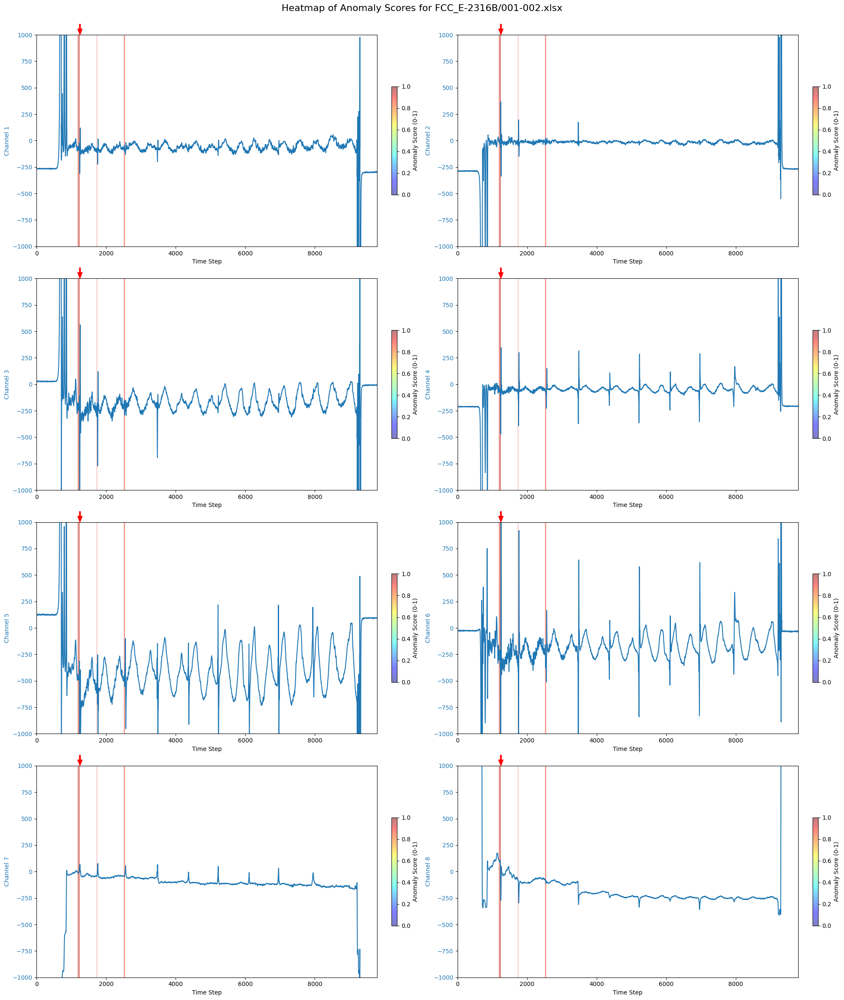

59/59 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-003.xlsx: 1215.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-003.xlsx_heatmap.png


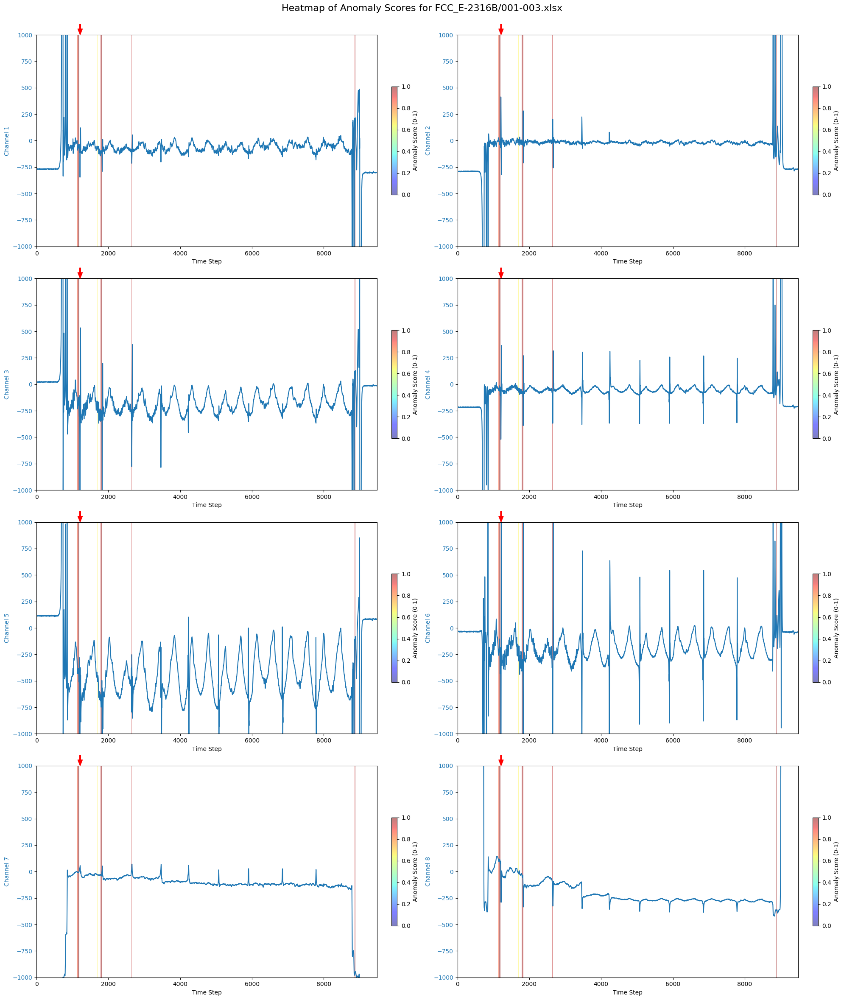

62/62 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-004.xlsx: 1259.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-004.xlsx_heatmap.png


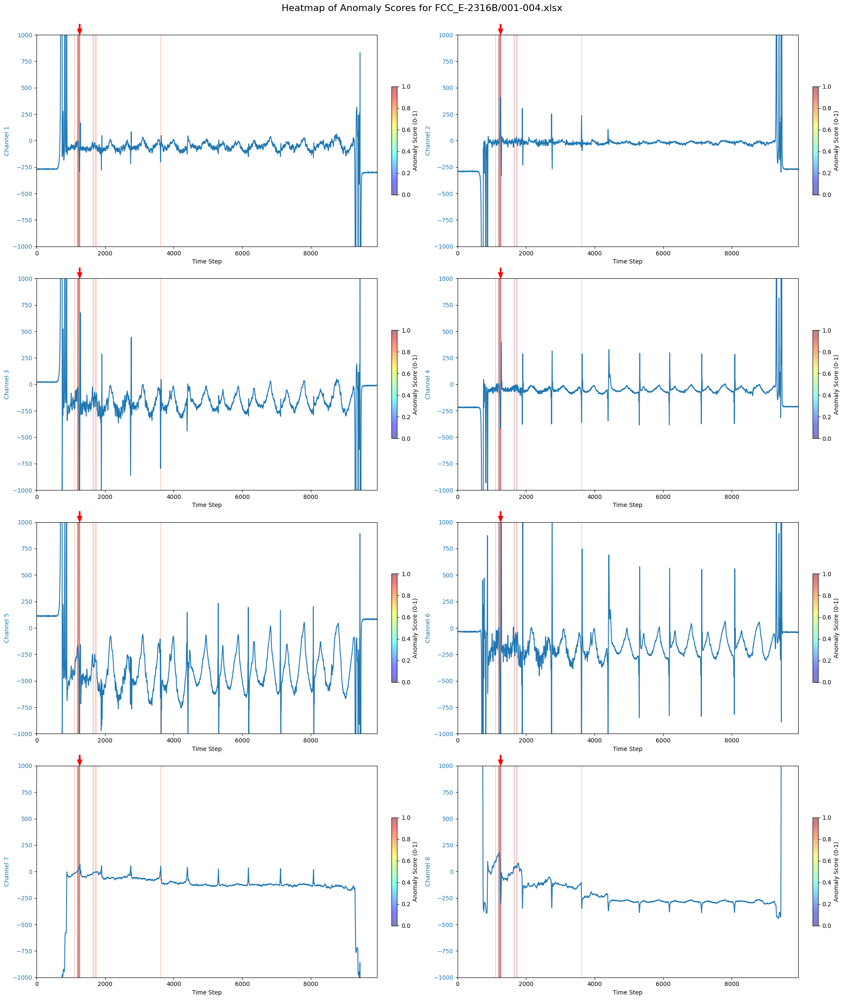

61/61 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-005.xlsx: 1142.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-005.xlsx_heatmap.png


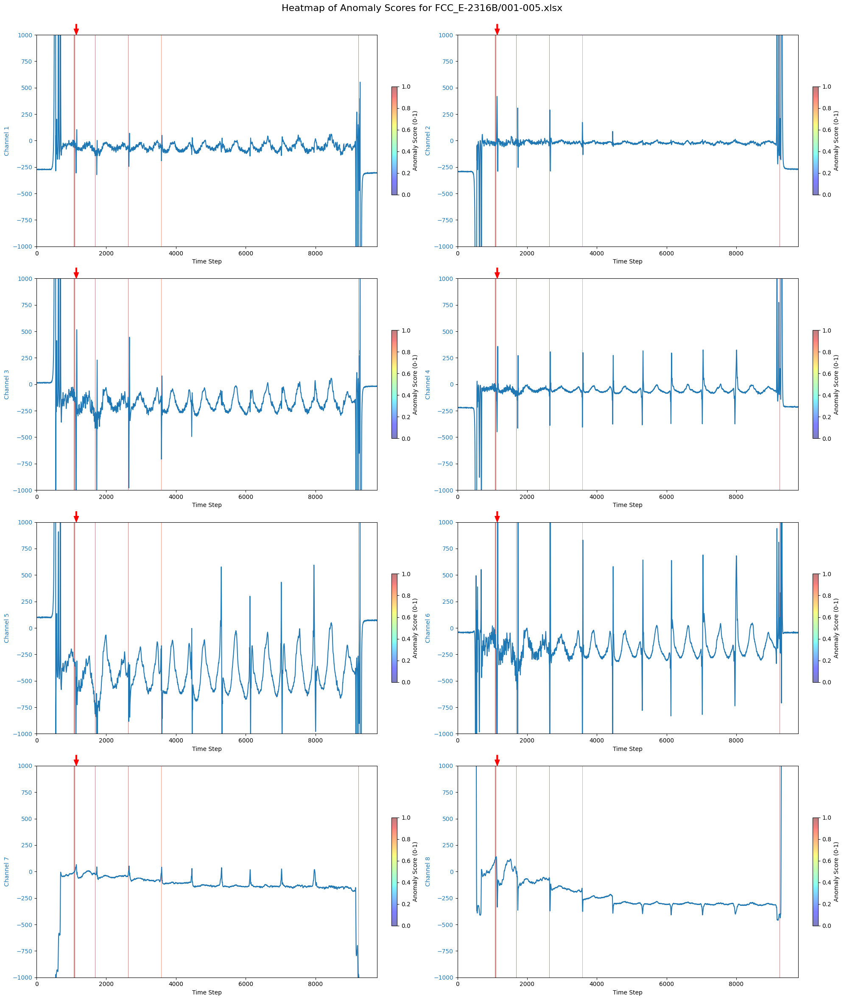

59/59 [==============================] - 1s 10ms/step
Thinning point for FCC_E-2316B/001-006.xlsx: 932.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-006.xlsx_heatmap.png


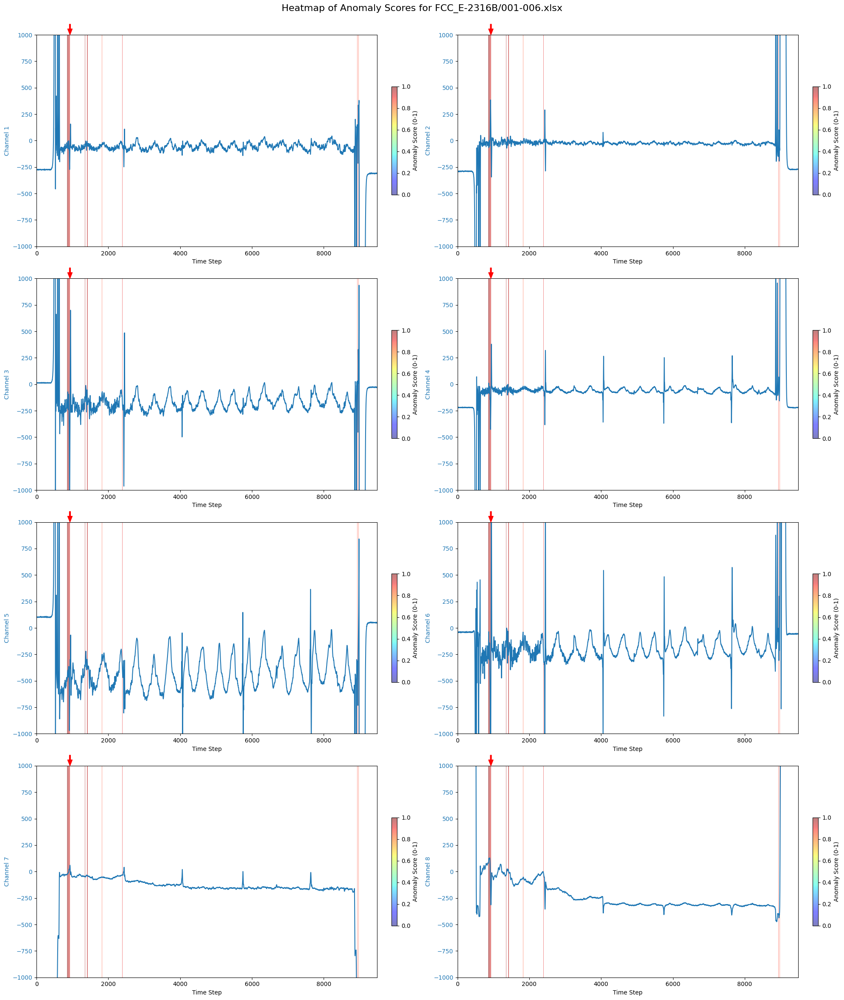

62/62 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-007.xlsx: 1130.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-007.xlsx_heatmap.png


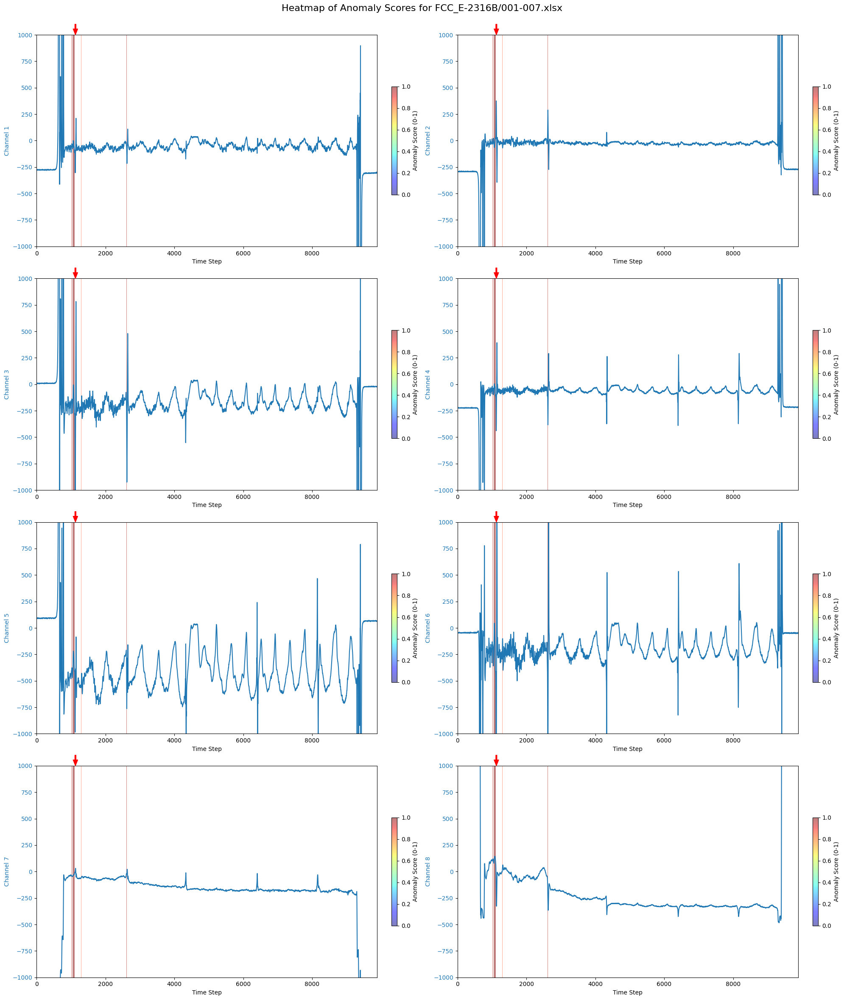

61/61 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-008.xlsx: 1030.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-008.xlsx_heatmap.png


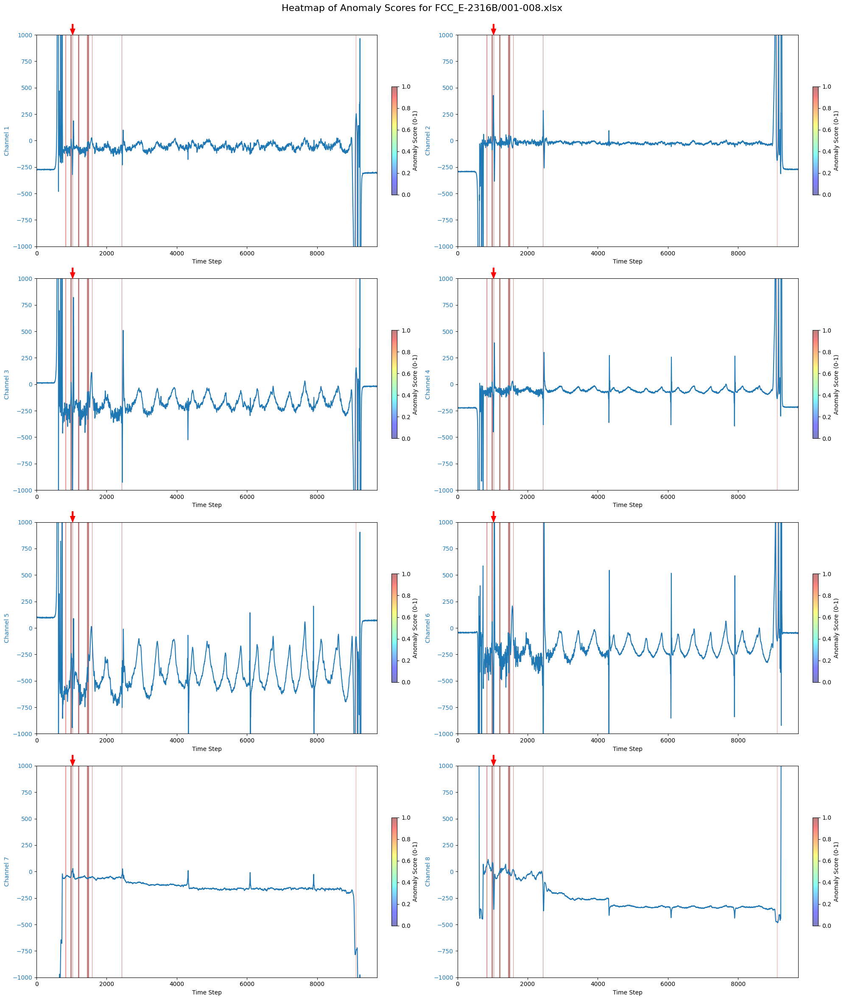

59/59 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-009.xlsx: 1300.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-009.xlsx_heatmap.png


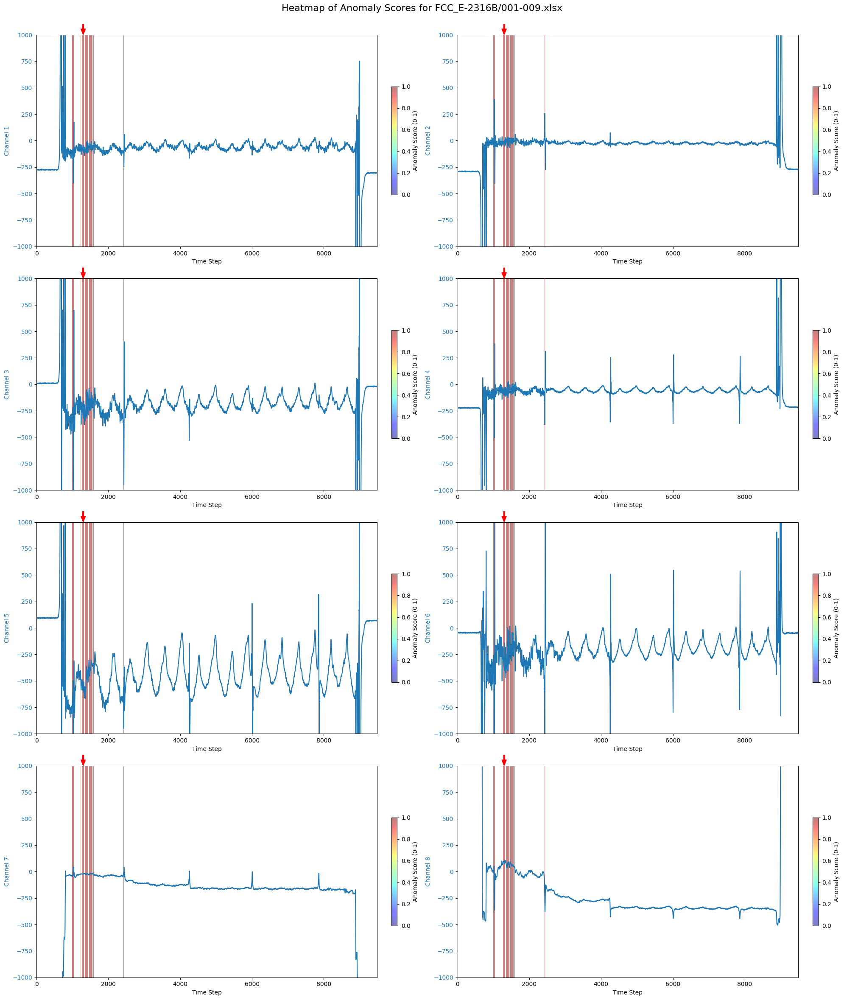

60/60 [==============================] - 1s 8ms/step
Thinning point for FCC_E-2316B/001-010.xlsx: 1176.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-010.xlsx_heatmap.png


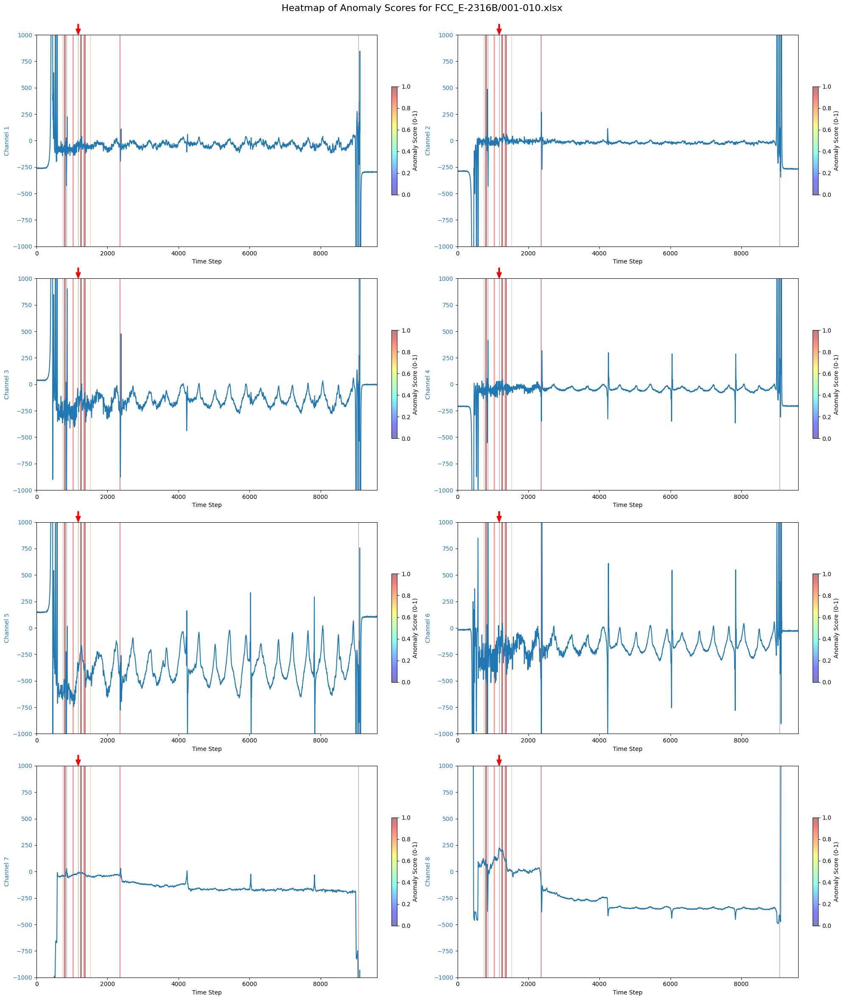

61/61 [==============================] - 1s 8ms/step
Thinning point for FCC_E-2316B/001-011.xlsx: 904.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-011.xlsx_heatmap.png


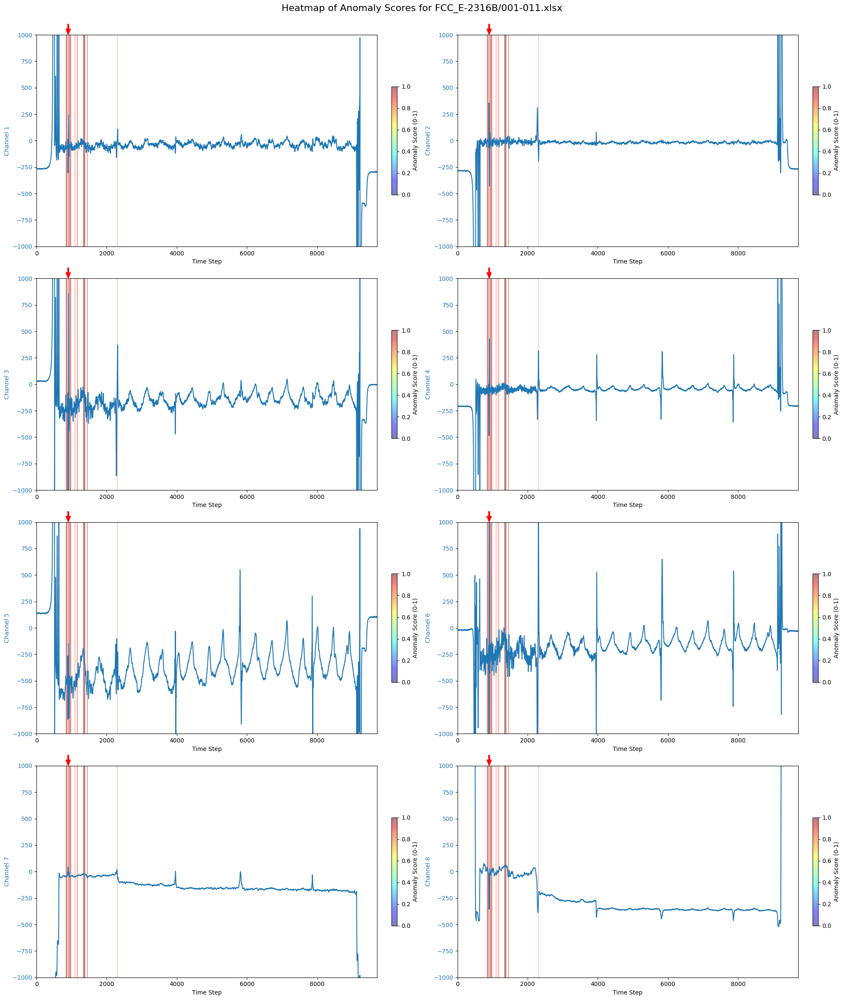

63/63 [==============================] - 1s 10ms/step
Thinning point for FCC_E-2316B/001-012.xlsx: 1068.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-012.xlsx_heatmap.png


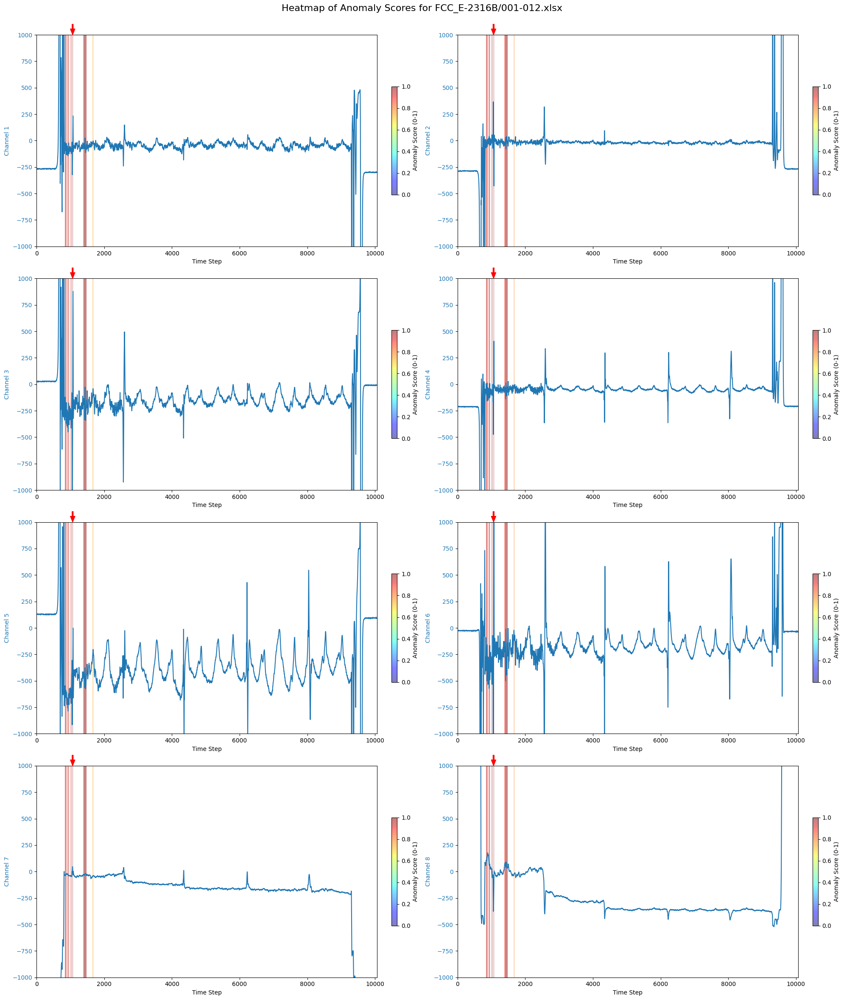

61/61 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-013.xlsx: 1168.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-013.xlsx_heatmap.png


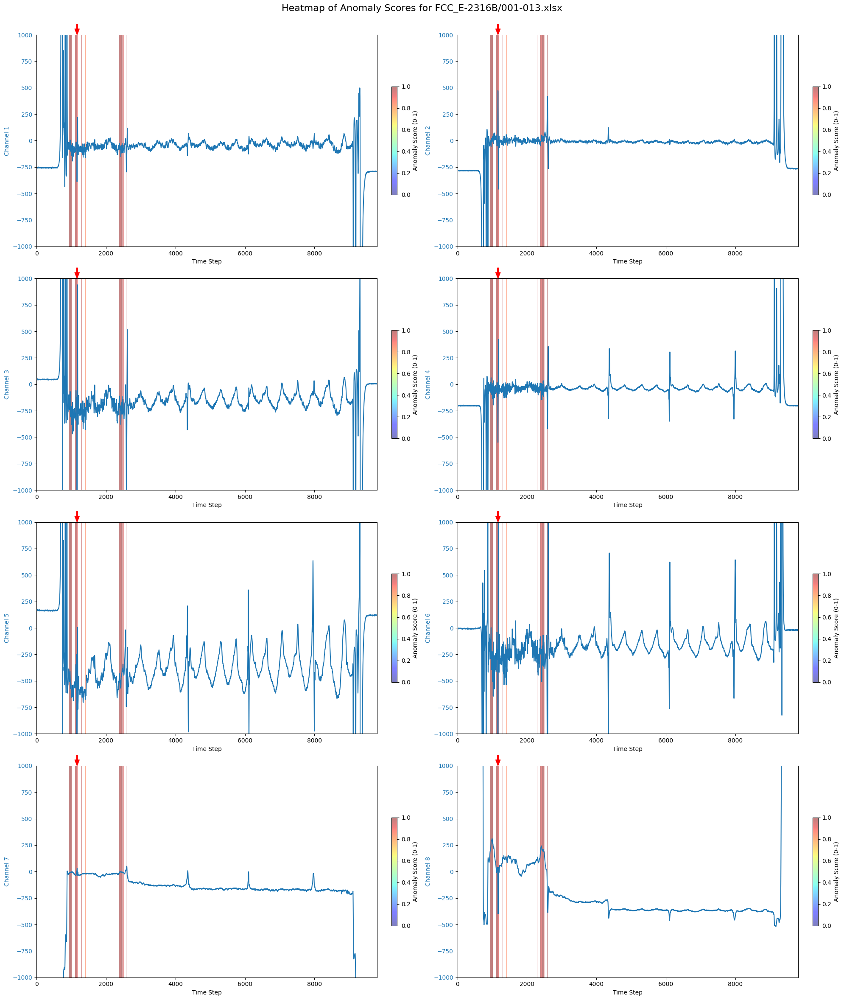

59/59 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-014.xlsx: 2344.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-014.xlsx_heatmap.png


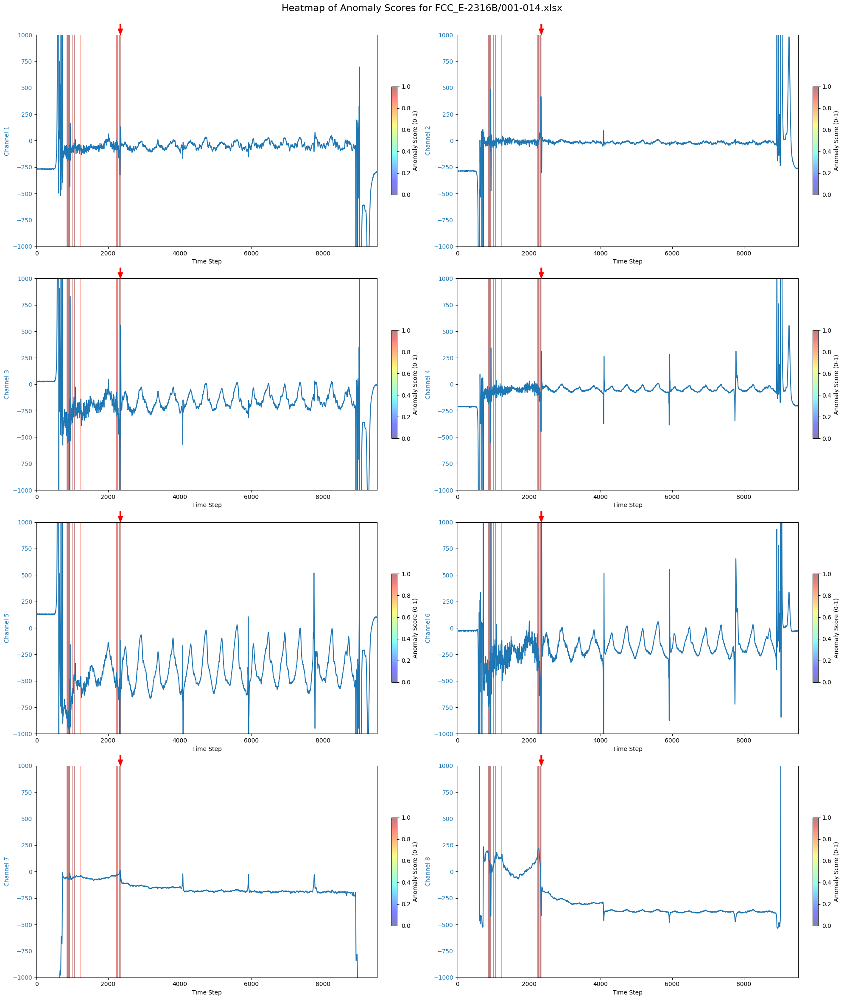

61/61 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-015.xlsx: 1436.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-015.xlsx_heatmap.png


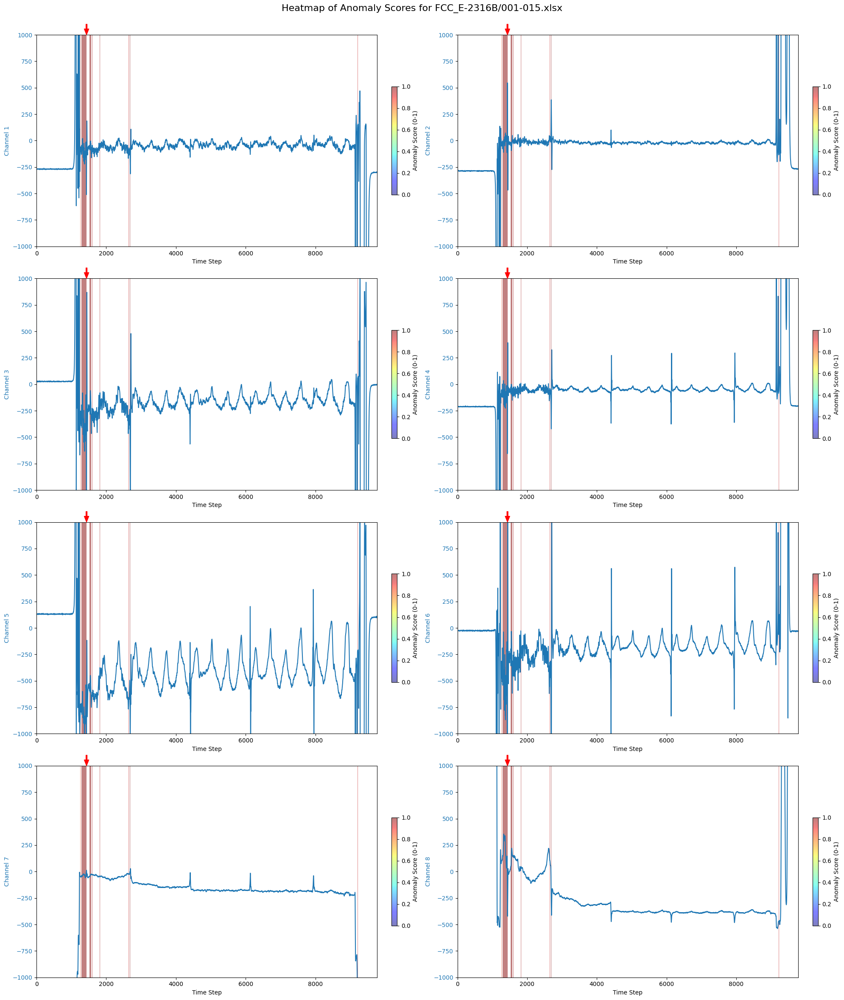

56/56 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-016.xlsx: 1052.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-016.xlsx_heatmap.png


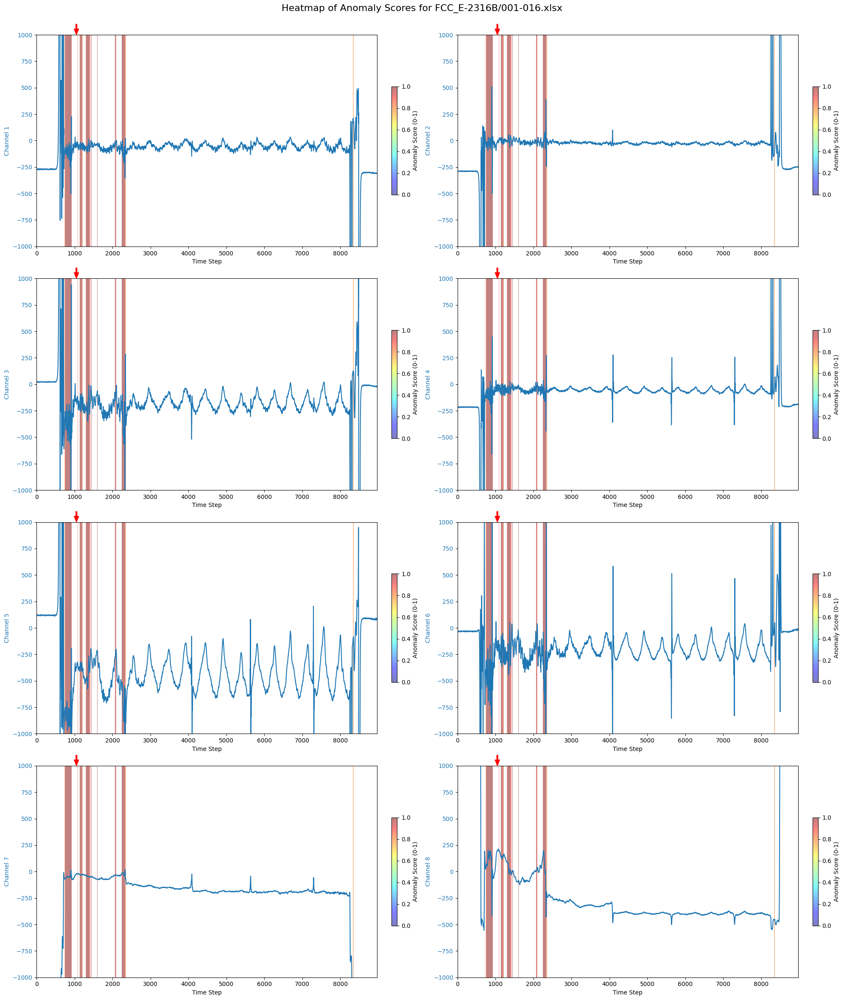

63/63 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-017.xlsx: 628.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-017.xlsx_heatmap.png


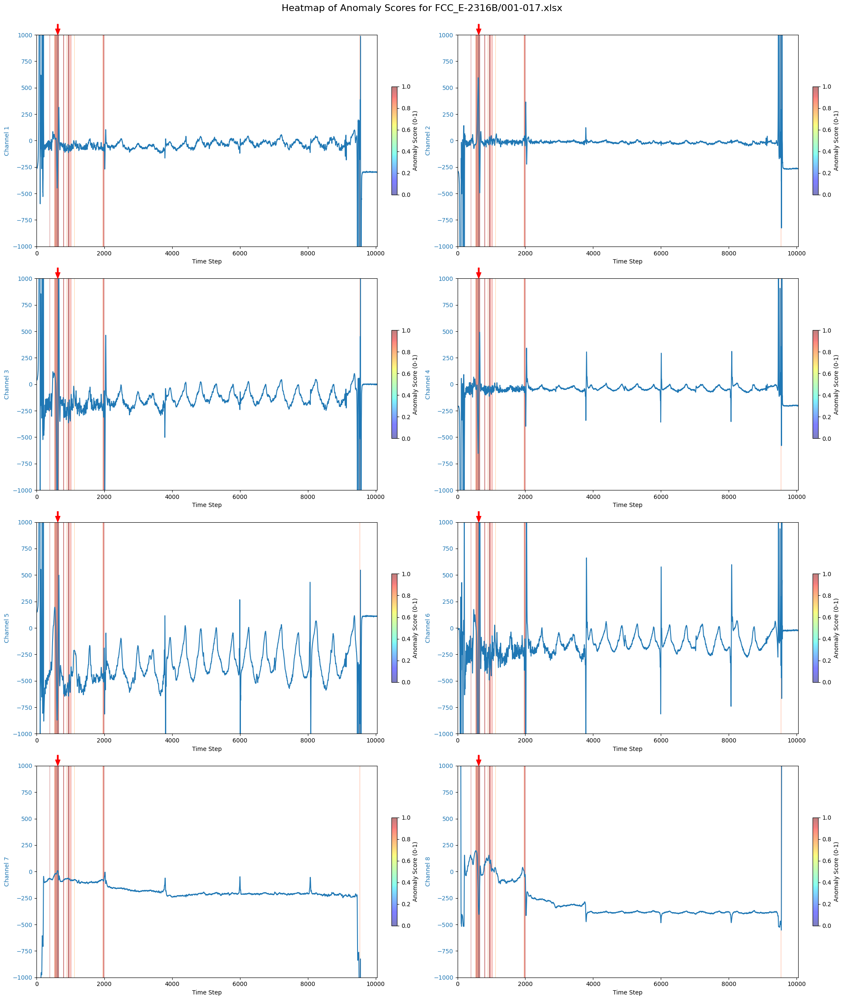

60/60 [==============================] - 1s 11ms/step
Thinning point for FCC_E-2316B/001-018.xlsx: 932.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-018.xlsx_heatmap.png


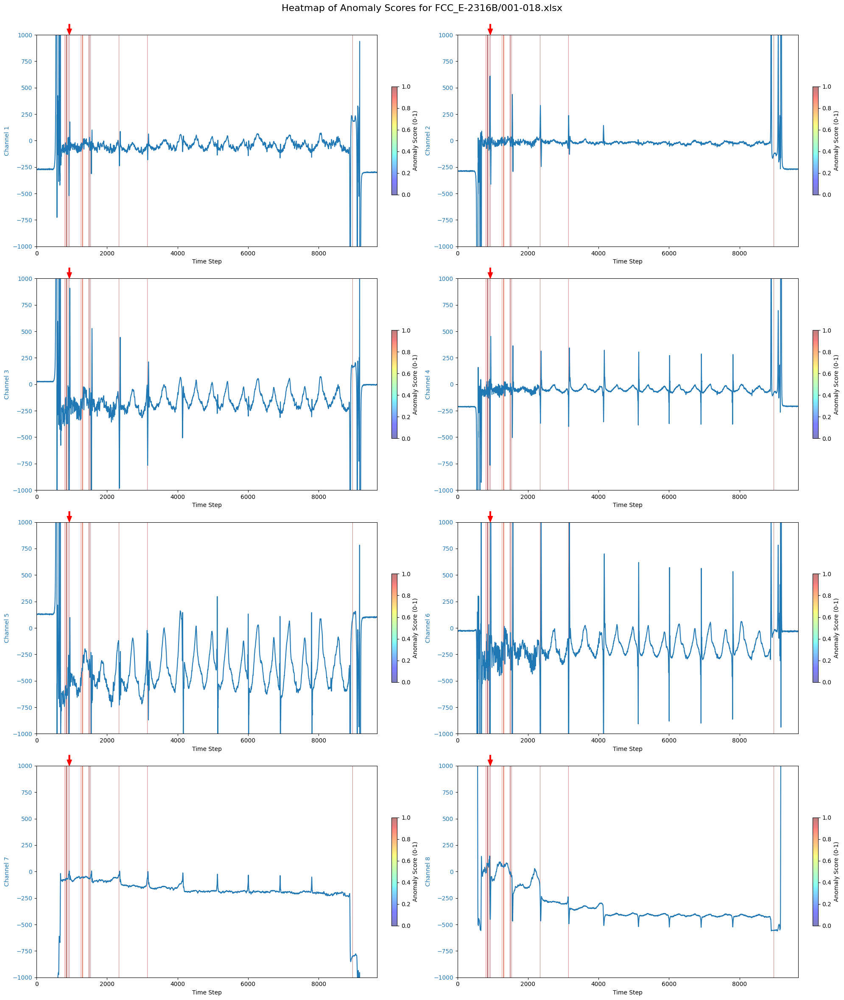

56/56 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-019.xlsx: 960.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-019.xlsx_heatmap.png


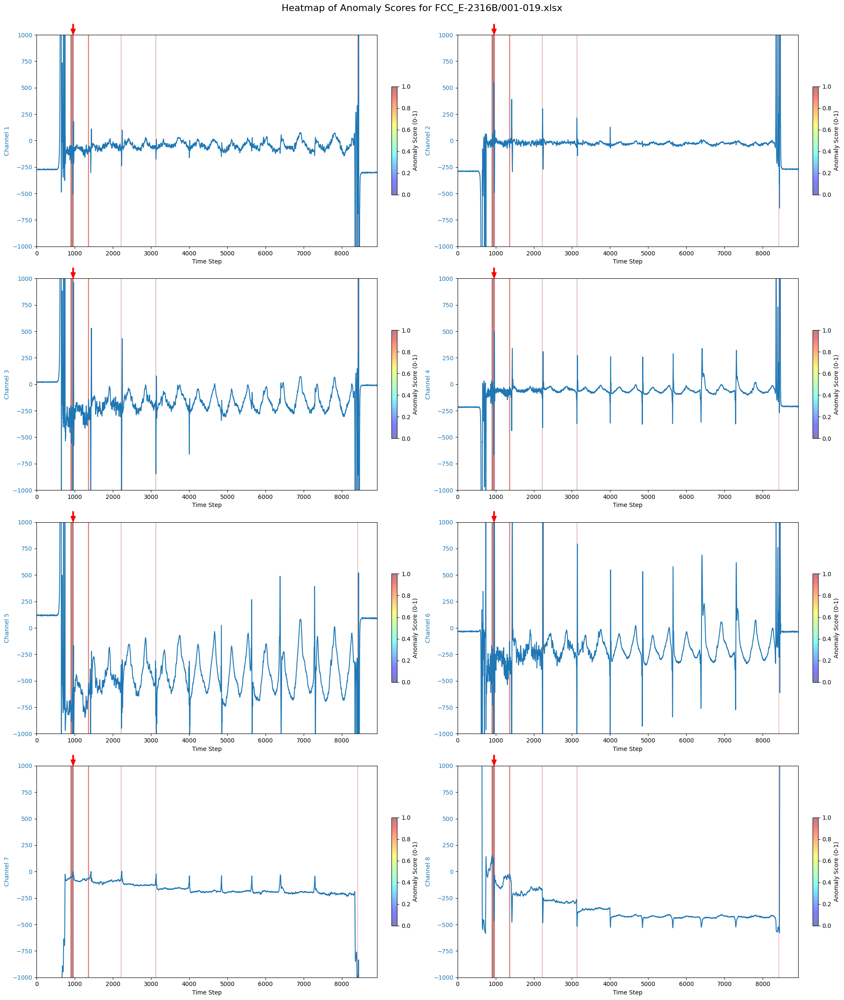

57/57 [==============================] - 1s 9ms/step
Thinning point for FCC_E-2316B/001-020.xlsx: 1116.0
Plot saved to C:\Users\r-fujita\Desktop\Phase1\test\FCC_E-2316B\001-020.xlsx_heatmap.png


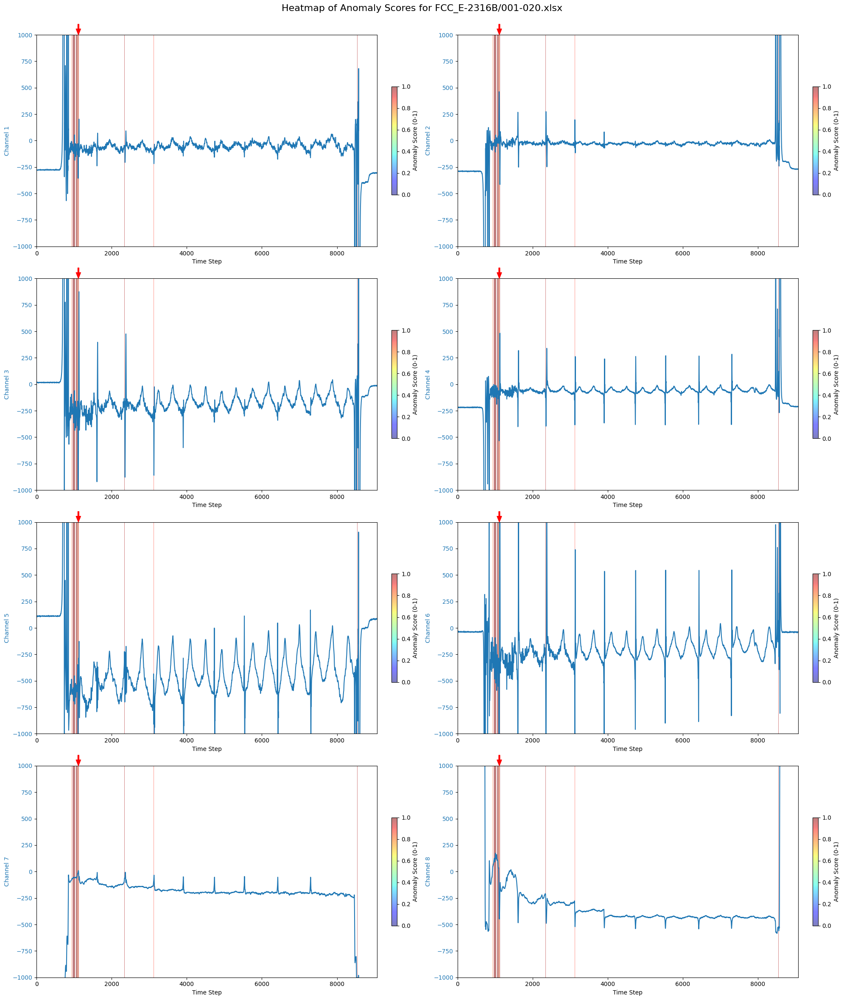

In [31]:
def predict_with_sliding_window_batch(model, waveform, window_size, stride):
    # ウィンドウを格納するリスト
    batch_windows = []
    
    for i in range(0, len(waveform) - window_size + 1, stride):
        window = waveform[i:i+window_size]
        batch_windows.append(window)
    
    # バッチとしてモデルに入力
    batch_windows = np.array(batch_windows)
    predictions = model.predict(batch_windows)
    
    return predictions.flatten()

# 波形データの読み込み関数
def load_full_waveform(filepath):
    df = pd.read_excel(filepath)
    waveform = df.values  # assuming data is in a matrix form with 8 columns (channels)
    return waveform

# カスタムカラーマップを作成する関数
def create_custom_colormap_with_alpha():
    ncolors = 256
    color_array = plt.cm.jet(np.linspace(0, 1, ncolors))  # jetカラーマップの256色を取得

    alpha_values = np.linspace(0, 1, ncolors)
    color_array[:, -1] = alpha_values  # アルファ値（透明度）を更新

    return ListedColormap(color_array)

# ヒートマップと波形の重ね合わせ表示関数（減肉点をプロット上部に矢印で表示）
def plot_waveform_with_heatmap(waveform, predictions, stride, threshold, title='Heatmap of Anomaly Scores', save_path=None, thinning_points=None):
    time_steps = np.arange(len(waveform))
    channels = waveform.shape[1]
    nrows = (channels + 1) // 2
    fig, axs = plt.subplots(nrows, 2, figsize=(20, 6 * nrows))

    cmap = create_custom_colormap_with_alpha()
    masked_predictions = np.ma.masked_where(predictions <= threshold, predictions)

    for i in range(channels):
        row = i // 2
        col = i % 2
        color = 'tab:blue'
        ax = axs[row, col]
        ax.set_xlabel('Time Step')
        ax.set_ylabel(f'Channel {i + 1}', color=color)
        ax.plot(time_steps, waveform[:, i], color=color)
        ax.tick_params(axis='y', labelcolor=color)
        ax.set_ylim(-1000, 1000)

        img = ax.imshow(masked_predictions[np.newaxis, :], cmap=cmap, aspect='auto', 
                        extent=[0, len(waveform), -1000, 1000], 
                        alpha=0.5, vmin=0.0, vmax=1.0)
        cbar = fig.colorbar(img, ax=ax, fraction=0.015, pad=0.04)
        cbar.set_label('Anomaly Score (0-1)')

        # 減肉点を波形データのプロット上部に矢印で表示
        if thinning_points is not None:
            for thinning_point in thinning_points:
                ax.annotate('', xy=(thinning_point, 1000), xytext=(thinning_point, 1100),
                            arrowprops=dict(facecolor='red', edgecolor='red', width=2, headwidth=8, headlength=10),
                            annotation_clip=False)

    for j in range(channels, nrows * 2):
        fig.delaxes(axs[j // 2, j % 2])

    fig.tight_layout()
    plt.suptitle(title, fontsize=16, verticalalignment='top')
    plt.subplots_adjust(top=0.95)

    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved to {save_path}")

    plt.show()

# 指定ディレクトリ内の全てのサブフォルダを再帰的に走査し、波形データに対して推論を行う関数（減肉点情報を追加）
def process_all_waveforms_in_subfolders(root_dir, judge_dir):
    for subdir, dirs, files in os.walk(root_dir):
        for file in files:
            if file.endswith('.xlsx'):
                filepath = os.path.join(subdir, file)
                waveform = load_full_waveform(filepath)
                predictions = predict_with_sliding_window_batch(model, waveform, window_size, stride)

                # 解析データ読み込み
                subfolder_name = os.path.basename(subdir)
                judge_filepath = os.path.join(judge_dir, f"{subfolder_name}.xlsx")
                
                # 解析データから減肉点を取得
                thinning_points = []
                if os.path.exists(judge_filepath):
                    df_judge = pd.read_excel(judge_filepath, header=None)
                    for row in df_judge.itertuples(index=False):
                        data_name = f"{row[0]:03}-{row[1]:03}"
                        if data_name in file:
                            thinning_point = row[11]/2  # 12列目が減肉点の位置
                            thinning_points.append(thinning_point)
                            print(f"Thinning point for {subfolder_name}/{file}: {thinning_point}")  # 減肉点の値を出力
                else:
                    print(f"Judge file not found for {subfolder_name}/{file}")  # 解析データが見つからない場合のメッセージを出力

                title = f'Heatmap of Anomaly Scores for {subfolder_name}/{file}'
                save_path = os.path.join(subdir, f"{file}_heatmap.png")

                # 減肉点情報を含めてプロット
                plot_waveform_with_heatmap(waveform, predictions, stride, threshold, title=title, save_path=save_path, thinning_points=thinning_points)


# --- 実行 ---
window_size = 200
stride = 5
threshold = 0.50
root_dir = r"C:\Users\r-fujita\Desktop\Phase1\test"
judge_dir = r"C:\Users\r-fujita\Desktop\Phase1\教師データJUDGE"


process_all_waveforms_in_subfolders(root_dir, judge_dir)

In [ ]:
##誤検知の数値化
def predict_with_sliding_window_batch(model, waveform, window_size, stride):
    # ウィンドウを格納するリスト
    batch_windows = []
    
    for i in range(0, len(waveform) - window_size + 1, stride):
        window = waveform[i:i+window_size]
        batch_windows.append(window)
    
    # バッチとしてモデルに入力
    batch_windows = np.array(batch_windows)
    predictions = model.predict(batch_windows)
    
    return predictions.flatten()

# 波形データの読み込み関数
def load_full_waveform(filepath):
    df = pd.read_excel(filepath)
    waveform = df.values  # assuming data is in a matrix form with 8 columns (channels)
    return waveform

# 誤検知の数値化関数
def evaluate_predictions(predictions, thinning_points, stride, threshold):
    correct_predictions = 0
    incorrect_predictions = 0
    
    if len(thinning_points) == 0 or thinning_points[0] == 0:
        # 減肉点が無い場合、推論結果が全てFalseであれば正解
        if not np.any(predictions > threshold):
            correct_predictions = 1
        else:
            incorrect_predictions = 1
    else:
        for thinning_point in thinning_points:
            start_index = int(thinning_point // stride)
            end_index = start_index + 1
            
            if np.any(predictions[start_index:end_index] > threshold):
                correct_predictions += 1
            else:
                incorrect_predictions += 1
    
    return correct_predictions, incorrect_predictions

# 指定ディレクトリ内の全てのサブフォルダを再帰的に走査し、波形データに対して推論を行う関数（誤検知の数値化）
def process_all_waveforms_in_subfolders(root_dir, judge_dir):
    total_correct_predictions = 0
    total_incorrect_predictions = 0
    
    for subdir, dirs, files in os.walk(root_dir):
        for file in files:
            if file.endswith('.xlsx'):
                filepath = os.path.join(subdir, file)
                waveform = load_full_waveform(filepath)
                predictions = predict_with_sliding_window_batch(model, waveform, window_size, stride)

                # 解析データ読み込み
                subfolder_name = os.path.basename(subdir)
                judge_filepath = os.path.join(judge_dir, f"{subfolder_name}.xlsx")
                
                # 解析データから減肉点を取得
                thinning_points = []
                if os.path.exists(judge_filepath):
                    df_judge = pd.read_excel(judge_filepath, header=None)
                    for row in df_judge.itertuples(index=False):
                        data_name = f"{row[0]:03}-{row[1]:03}"
                        if data_name in file:
                            thinning_point = row[11]/2  # 12列目が減肉点の位置
                            thinning_points.append(thinning_point)
                else:
                    print(f"Judge file not found for {subfolder_name}/{file}")  # 解析データが見つからない場合のメッセージを出力

                # 誤検知の数値化
                correct_predictions, incorrect_predictions = evaluate_predictions(predictions, thinning_points, stride, threshold)
                total_correct_predictions += correct_predictions
                total_incorrect_predictions += incorrect_predictions
                
                print(f"Evaluation for {subfolder_name}/{file}:")
                print(f"  Correct predictions: {correct_predictions}")
                print(f"  Incorrect predictions: {incorrect_predictions}")
    
    print("Overall evaluation:")
    print(f"  Total correct predictions: {total_correct_predictions}")
    print(f"  Total incorrect predictions: {total_incorrect_predictions}")


# --- 実行 ---
window_size = 100
stride = 5
threshold = 0.75
root_dir = r"C:\Users\r-fujita\Desktop\Phase1\test"
judge_dir = r"C:\Users\r-fujita\Desktop\Phase1\教師データJUDGE"

process_all_waveforms_in_subfolders(root_dir, judge_dir)

Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RangeDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op MapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op PrefetchDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op FlatMapDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op TensorDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op _EagerConst in device /job:localhost/replica:0/task:0/device:GPU:0
Executing op RepeatDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ZipDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op ParallelMapDatasetV2 in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op OptionsDataset in device /job:localhost/replica:0/task:0/device:CPU:0
Executing op Opt